In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from JSAnimation import IPython_display

class chelsea_cost_demo():
    def __init__(self):
        a = 0
        self.x = []
        self.y = []
        
    # load in a two-dimensional dataset from csv - input should be in first column, oiutput in second column, no headers 
    def load_data(self,*args):
        # load data
        data = np.asarray(pd.read_csv(args[0],header = None))
    
        # import data and reshape appropriately
        self.x = data[:,0:-1]
        self.x.shape = (len(self.x),1)
        self.y = data[:,-1]
        self.y.shape = (len(self.y),1)

    # compute least squares cost between loaded points and sample line
    def compute_cost(self,b,w):
        y_pred = b + w*self.x
        cost = np.sum((self.y - y_pred)**2)
        return cost
    
    # create random slope and intercept - make the 'random' but so that they are visible in the panel
    def random_line(self):
        b = 3*np.random.rand(1) - 1.5
        w = np.random.randn(1)
        return w,b
    
    # animate sampling random lines and plotting squared error
    def animate_sampling(self,num_samples):
        # first generate all of the samples and compute all of the costs
        line_params = []   # container for storing random weights
        costs = []         # container for storing associated cost of random line on data
        for c in range(num_samples):
            # get random b and w - create a random line
            b,w = self.random_line()
            line_params.append([b,w])
            
            # use random line to compute cost on data
            g = self.compute_cost(b,w)
            costs.append(g)
        
        # pre-compute things that will be printed in each frame of the animation - e.g., input of each random line
        view_gap = (max(self.x) - min(self.x))/float(10)
        x_line = np.linspace(min(self.x)-view_gap,max(self.x)+view_gap,100)
        
        ### with all of the lines / costs computed we can animate them!
        # create figure and panels
        fig = plt.figure(num=None, figsize=(15,5), dpi=80, facecolor='w', edgecolor='k')
        ax1 = plt.subplot(121)
        ax2 = plt.subplot(122,projection='3d')
        
        ### plot the true cost surface and a reference
        # create surface over range of b and w
        r = np.linspace(-2.5,2.5,100)   
        s,t = np.meshgrid(r,r)
        shape = np.shape(s)
        s = np.reshape(s,(np.size(s),1))
        t = np.reshape(t,(np.size(t),1))
        cost_surface = np.zeros(np.shape(s))
        for i in range(len(s)):
            cost = self.compute_cost(s[i],t[i])
            cost_surface[i] = cost
        
        # reshape cost surface vector for plotting
        s.shape = (np.size(r),np.size(r))
        t.shape = (np.size(r),np.size(r))
        cost_surface.shape = (np.size(r),np.size(r))      
        
        # plot cost surface and reference
        ax2.plot_surface(s,t,cost_surface,alpha = 0.15)
        ax2.plot_surface(s,t,cost_surface*0,alpha = 0.1)
        
        ## clean up right plot, label axes, etc., - we won't be clearing it every frame, so might as well just take care of this once
        # set viewing angle
        ax2.view_init(10,120)        

        # turn off tick marks - just to keep the panel from being to busy, but you might want to see them so just delete these to get axes values back
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.set_zticks([])

        # add axis labels
        ax2.set_xlabel('intercept',fontsize = 14,labelpad = -5)
        ax2.set_ylabel('slope',fontsize = 14,labelpad = -5)
        ax2.zaxis.set_rotate_label(False)  # disable automatic rotation
        ax2.set_zlabel('cost  ',fontsize = 14, rotation = 0,labelpad = 1)
            
        def show_samples(c):
            # get current random line and associated cost
            r = line_params[c]
            b = r[0]
            w = r[1]
            g = costs[c]
 
            ### plot left panel
            # clear panel for next slide in animation
            ax1.cla()
            
            # plot points
            artist = ax1.scatter(self.x,self.y,color = 'k',s = 50)
            
            # plot random line
            y_line = b + w*x_line
            ax1.plot(x_line,y_line,color = 'r',linewidth = 4)
            
            ### plot right panel
            # plot line parameters with associated cost
            ax2.scatter(b,w,g,color = 'r',s = 50,alpha = 0.4)

            return artist,  # for this animation to work something must be returned to the animator - doesn't seem to matter which object 
        
        anim = animation.FuncAnimation(fig, show_samples,frames=num_samples, interval=num_samples, blit=True)
        
        # set frames per second in animation
        IPython_display.anim_to_html(anim,fps = 10)
        
        return(anim)


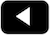
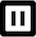
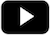
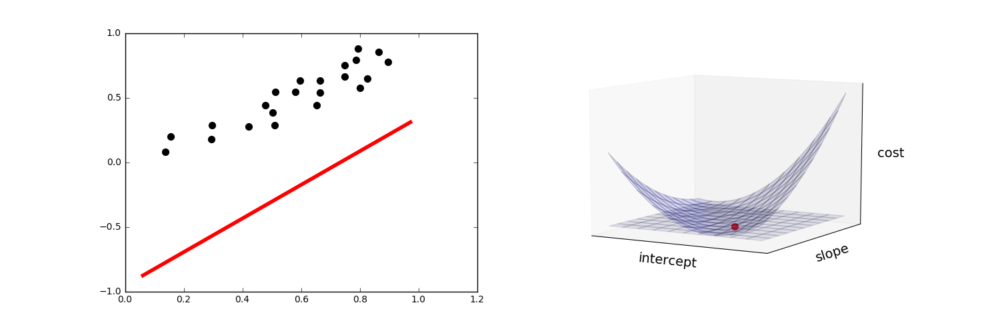
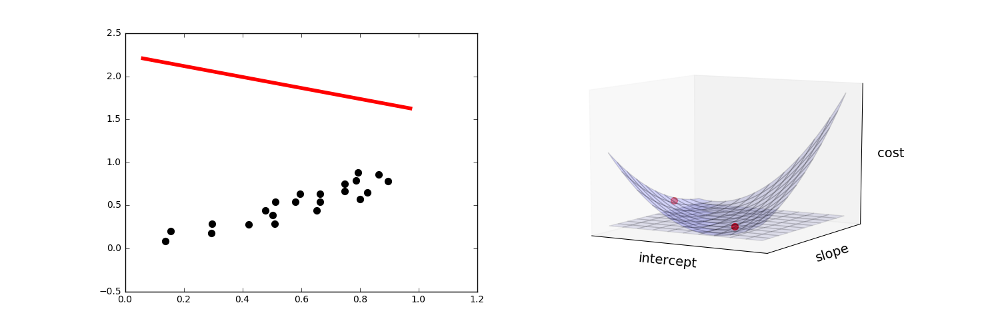
...
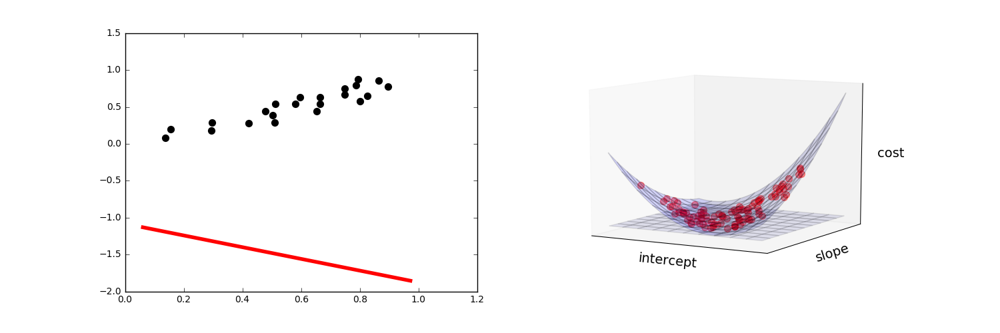
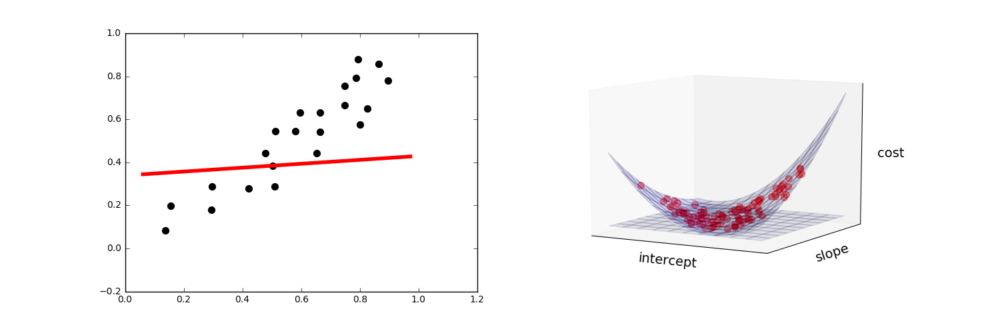
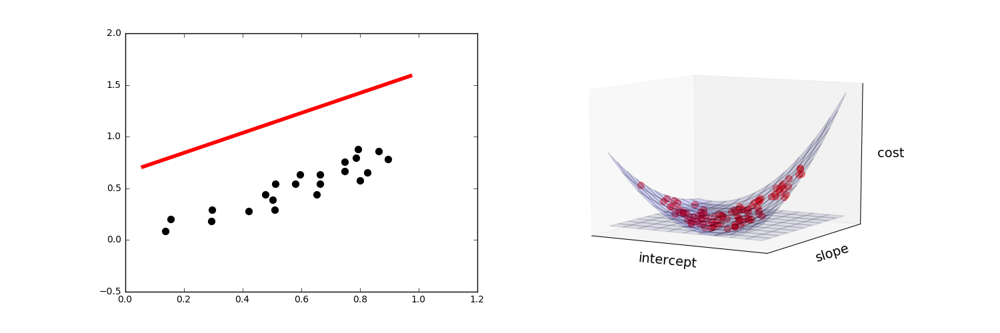
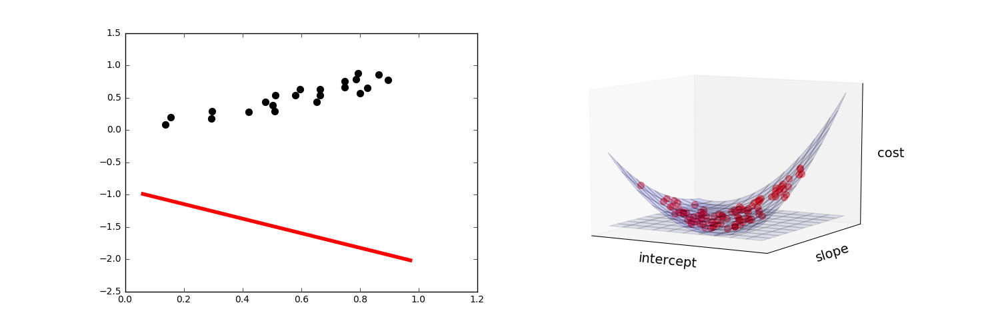
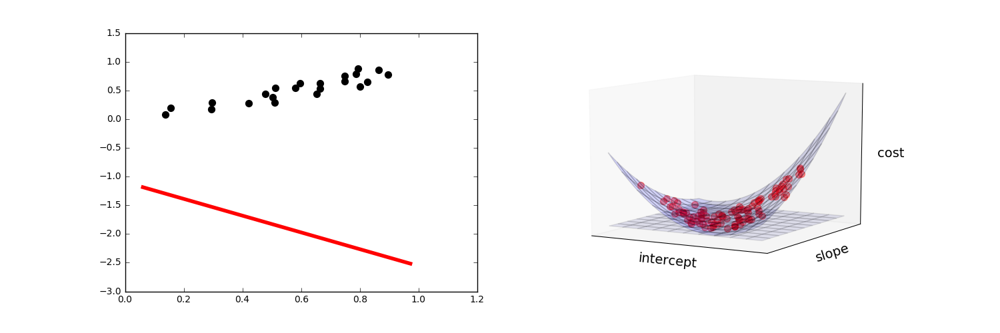

In [2]:
# create instance of demo
demo = chelsea_cost_demo()

# dataset name
csvname = 'toy_regression_data.csv'

# load dataset
demo.load_data(csvname)

# define number of samples - number of random lines - and run the animator
num_samples = 100
demo.animate_sampling(num_samples)